## Explatory Data Analysis

### Introduction

At this point we have a general idea about our data. We have 14 categorical variables and 4 numerical variables. We are interested in creating a model that can predict whether a person has heart disease or not, given their BMI, AlcoholDrinking, Kidney Disease, etc. 

#### Imports

In [99]:
#conda install -c plotly plotly


import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as plotly

#from sklearn.decomposition import PCA
#from sklearn.preprocessing import scale

In [100]:
hearts = pd.read_csv("C:\\Users\\hanna\\OneDrive\\Desktop\\All Folders\\Data Science\\SpringBoard\\Capstone 2\\Personal Key Indicators of Heart Disease\\heart_2020_cleaned.csv")

In [101]:
hearts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  float64
 6   MentalHealth      319795 non-null  float64
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  float64
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

In [102]:
hearts.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No


one thing we can check for is we have any duplicated rows.

We also can see that almost 77% of instances consists "white" while all others categories in Race are less than 10%. 

Since we have four numerical values: BMI, Sleeptime, MentalHealth, PhysicalHealth. Let us check for outliers in BMI, and keep in account that they may contain information that might be sufficient. Hence, we will check for them, but we will not get rid of them yet.

In [103]:
# Provides us with the minimum and maximum threshold, 0.1% to 95% respectively.
min_bmi, max_bmi = hearts['BMI'].quantile([0.001, 0.98])
print(hearts[hearts.BMI > max_bmi].shape)
print(hearts[hearts.BMI < min_bmi].shape)
max_bmi

(6345, 18)
(318, 18)


44.93

After working on outliers, let us see if we have any duplicated rows.

In [104]:
hearts.duplicated().any()

True

In [105]:
hearts.duplicated().sum()

18078

In [106]:
hearts.duplicated(subset=['BMI', 'SleepTime', 'AgeCategory', 'PhysicalHealth', 'MentalHealth'], keep='first').sum()

128199

We see that we have around 18k rows that are duplicates, however since we have more categorical variables than numerical, this can be by chance. Also, as I add more columns to subset on, the count of rows that are duplicates decreases. Dropping these rows will not be a good idea yet, perhaps when modeling we can have two different models with and without duplicates to see which one performs better.

In [107]:
hearts_num = hearts.select_dtypes('float64')

array([[<AxesSubplot:title={'center':'BMI'}>,
        <AxesSubplot:title={'center':'PhysicalHealth'}>],
       [<AxesSubplot:title={'center':'MentalHealth'}>,
        <AxesSubplot:title={'center':'SleepTime'}>]], dtype=object)

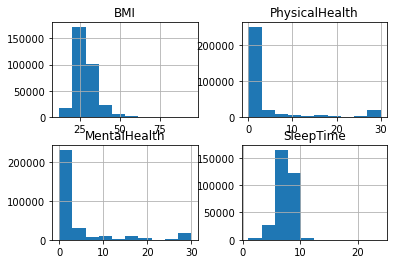

In [108]:
hearts_num.hist()

PhysicalHealth here shows that most of the instances did not have any physical hardships (0 days), same goes for MentalHealth, in other words our data is skewed to the right. 
For SleepTime most of our data is with 6 - 9 hours of sleep.
BMI is consistent with the CDC where the BMI of 
-  < 18.5 = underweight
-  18.5 - 25 = healthy
-  25 - 30 = overweight
-  30 + = Obesity

Where 
-  30 - 35 = Obesity Class 1
-  35 - 40 = Obesity Class 2
-  40 + = Obesity Class 3

https://www.cdc.gov/obesity/adult/defining.html

We will replace the categorical values in heart disease so we can use it for furthur explorations.

In [109]:
# replacing values for future graphs.
hearts['HeartDisease'].replace(['No', 'Yes'], [0, 1], inplace=True)

In [110]:
pd.DataFrame(hearts['Diabetic'].value_counts()).style.bar(color='aquamarine')

,Diabetic
No,269653
Yes,40802
"No, borderline diabetes",6781
Yes (during pregnancy),2559


In [111]:
pd.DataFrame(hearts['AgeCategory'].value_counts()).style.bar(color='#ff781c')

,AgeCategory
65-69,34151
60-64,33686
70-74,31065
55-59,29757
50-54,25382
80 or older,24153
45-49,21791
75-79,21482
18-24,21064
40-44,21006


Are older patients are at more risk of a Heart Disease?

Text(0, 0.5, 'Chance of Heart Disease')

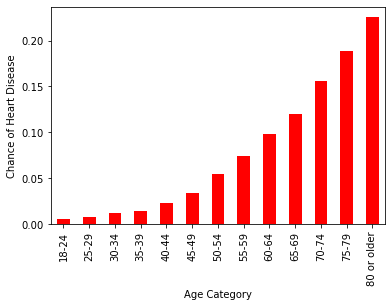

In [112]:
#print(hearts.groupby('AgeCategory')['HeartDisease'].mean())
ax = hearts.groupby('AgeCategory')['HeartDisease'].mean().plot(kind = 'bar', color = 'r')
ax.set_xlabel('Age Category')
ax.set_ylabel('Chance of Heart Disease')

We can see that older patients have more chance to have a heart disease. 
But what about Smoking? Having diabetes? Are there more males than females? Are males more likely to have a HeartDisease

In [113]:
plotly.pie(hearts, names = 'Smoking', title='Number of Smokers')

Text(0, 0.5, 'Chance of a Heart Disease')

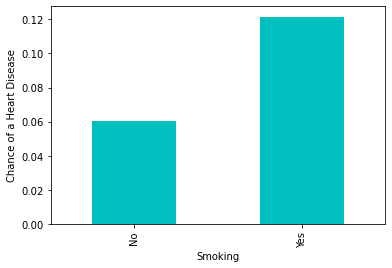

In [114]:
#print(hearts.groupby('Smoking')['HeartDisease'].mean())
ax = hearts.groupby('Smoking')['HeartDisease'].mean().plot(kind='bar', color = 'c')
ax.set_ylabel('Chance of a Heart Disease')

We can see that the chance of a heart disease gets higher if you are a smoker. What about diabetes?

Diabetic
No                         0.064969
No, borderline diabetes    0.116355
Yes                        0.219524
Yes (during pregnancy)     0.042204
Name: HeartDisease, dtype: float64


<AxesSubplot:xlabel='Diabetic'>

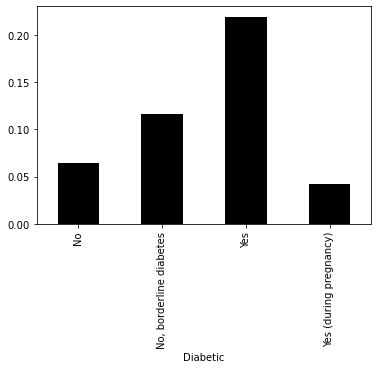

In [115]:
print(hearts.groupby('Diabetic')['HeartDisease'].mean())
hearts.groupby('Diabetic')['HeartDisease'].mean().plot(kind='bar', color = 'k')

Making the "No" and "No, borderling diabetes" in one category would not be ideal as we can see the difference or change in heart disease given a certain category. 

In [116]:
#print(hearts.groupby(['Sex', 'Smoking'])['HeartDisease'].mean())
#hearts.groupby(['Sex', 'Smoking'])['HeartDisease'].mean().plot(kind='bar', color = 'y')
#print(pd.DataFrame(hearts['Sex'].value_counts()).style.bar(color='r'))
plotly.pie(hearts, names = 'Sex', title='Male vs Female')

<AxesSubplot:xlabel='Sex'>

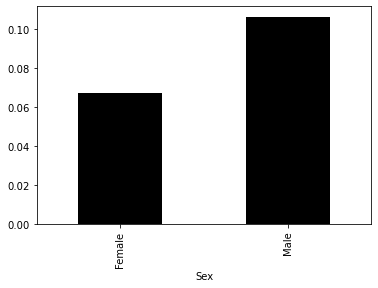

In [117]:
hearts.groupby('Sex')['HeartDisease'].mean().plot(kind='bar', color = 'k')

Without involving any categories, we see that we have more Females in our dataset, however men are more likely to have a Heart Disease.

In [118]:
print(hearts.groupby(['KidneyDisease', 'SkinCancer', 'Smoking','Stroke'])['HeartDisease'].mean())

KidneyDisease  SkinCancer  Smoking  Stroke
No             No          No       No        0.042850
                                    Yes       0.280864
                           Yes      No        0.090297
                                    Yes       0.370179
               Yes         No       No        0.107699
                                    Yes       0.333333
                           Yes      No        0.172057
                                    Yes       0.425764
Yes            No          No       No        0.205310
                                    Yes       0.494929
                           Yes      No        0.287475
                                    Yes       0.532353
               Yes         No       No        0.286353
                                    Yes       0.604651
                           Yes      No        0.349845
                                    Yes       0.597884
Name: HeartDisease, dtype: float64


This here is just an illustration for myself. As the illnesses increase, so does the chance of having a Heart Disease. For example, if a person has Kidney Disease, Skin Cancer, had a stroke before, and he/she also smokes, then on average the chance of having a heart disease given the information is 59.8%.

AlcoholDrinking
No     0.088022
Yes    0.052395
Name: HeartDisease, dtype: float64


<AxesSubplot:xlabel='AlcoholDrinking'>

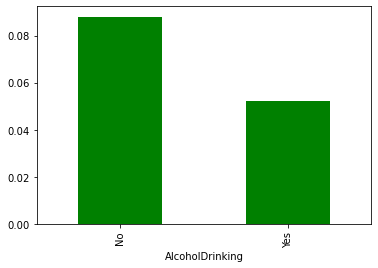

In [119]:
print(hearts.groupby('AlcoholDrinking')['HeartDisease'].mean())
hearts.groupby('AlcoholDrinking')['HeartDisease'].mean().plot(kind='bar', color = 'g')

Phew! At least people can enjoy their Alcohol without having to worry about a heart problem.

How does Stroke, KindeyDisease, & SkinCancer affect the possibility of a heart disease?

Stroke
No     0.074690
Yes    0.363659
Name: HeartDisease, dtype: float64


Text(0, 0.5, 'Chance of a Heart Disease')

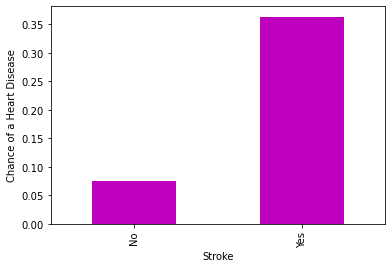

In [120]:
print(hearts.groupby('Stroke')['HeartDisease'].mean())
ax = hearts.groupby('Stroke')['HeartDisease'].mean().plot(kind='bar', color = 'm')
ax.set_ylabel('Chance of a Heart Disease')

A visit to a doctor for a full checkup is a must when one suffers through a stroke. 

Text(0, 0.5, 'Chance of a Heart Disease')

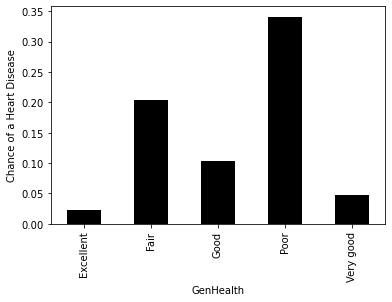

In [121]:
#print(hearts.groupby('GenHealth')['HeartDisease'].mean().sort_values())
ax = hearts.groupby('GenHealth')['HeartDisease'].mean().plot(kind='bar', color = 'k')
ax.set_ylabel('Chance of a Heart Disease')

The worse your general heatlh gets, the more likely hood of getting the heart disease.

SkinCancer
No     0.077224
Yes    0.167008
Name: HeartDisease, dtype: float64


Text(0, 0.5, 'Chance of a Heart Disease')

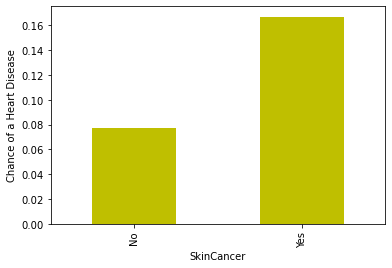

In [122]:
print(hearts.groupby('SkinCancer')['HeartDisease'].mean().sort_values())
ax = hearts.groupby('SkinCancer')['HeartDisease'].mean().plot(kind='bar', color = 'y')
ax.set_ylabel('Chance of a Heart Disease')

KidneyDisease
No     0.077652
Yes    0.293319
Name: HeartDisease, dtype: float64


Text(0, 0.5, 'Chance of a Heart Disease')

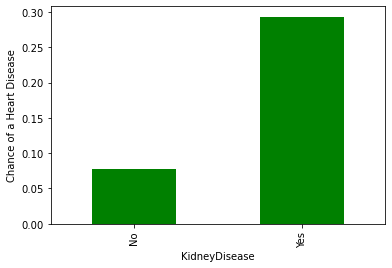

In [123]:
print(hearts.groupby('KidneyDisease')['HeartDisease'].mean().sort_values())
ax = hearts.groupby('KidneyDisease')['HeartDisease'].mean().plot(kind='bar', color = 'g')
ax.set_ylabel('Chance of a Heart Disease')

DiffWalking
No     0.062985
Yes    0.225805
Name: HeartDisease, dtype: float64


Text(0, 0.5, 'Chance of a HRaceeart Disease')

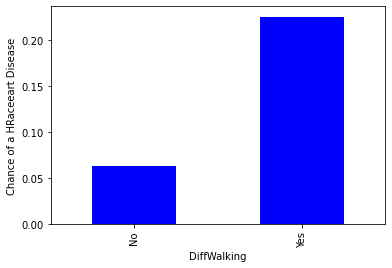

In [124]:
print(hearts.groupby('DiffWalking')['HeartDisease'].mean().sort_values())
ax = hearts.groupby('DiffWalking')['HeartDisease'].mean().plot(kind='bar', color = 'b')
ax.set_ylabel('Chance of a HRaceeart Disease')

Before we move on, here is something we have learned. The chance to catch a heart disease gets higher when you have, in other words, some of the symptons when one has a heart problem may be:
- Diabetes.
- Smoking.
- Kidney Disease.
- Skin Cancer.
- Your General Health is poor.
- Stroke.
- Difficulty Walking. 

When you drinking Alcohol or have Asthma, it may not increase your chance of a heart disease as some of the mention above do. 


Race
Asian                             0.032970
Hispanic                          0.052576
Black                             0.075374
Other                             0.081076
White                             0.091786
American Indian/Alaskan Native    0.104191
Name: HeartDisease, dtype: float64


Text(0, 0.5, 'Chance of a HRaceeart Disease')

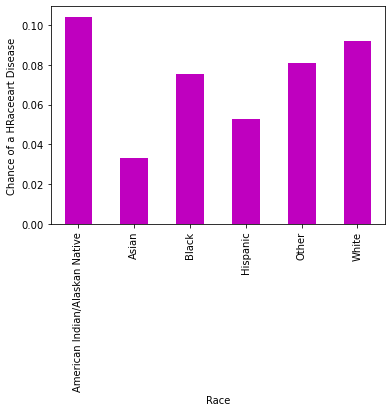

In [125]:
print(hearts.groupby('Race')['HeartDisease'].mean().sort_values())
ax = hearts.groupby('Race')['HeartDisease'].mean().plot(kind='bar', color = 'm')
ax.set_ylabel('Chance of a HRaceeart Disease')

In [126]:
hearts.Race.value_counts(normalize=True)

White                             0.766779
Hispanic                          0.085824
Black                             0.071730
Other                             0.034172
Asian                             0.025229
American Indian/Alaskan Native    0.016267
Name: Race, dtype: float64

Only 1.5% of people are American Indian/Alaskan Native, yet they have the highest percent of a heart disease.

In [127]:
hearts.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,0,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,0,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,0,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,0,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No


There are two ways I will do pairwise correlation. The first one will have dummies and because of multiple categories we will end up with a lot of columns. To tackle that, we will break the columns in seven folds and then run the correlation on each with our target feature in every fold.
Second way will be we assign a numerical value to our categories we do not end up with a lot of columns, and then run the correlation on it.

We can also run a correlation with first method instead of breaking into seven folds, however I will need to consult my mentor to extract information from this curse of dimensionality.

Next, we will change all the categorical variables to numerical variables. For columns mentioned below in columns, 0: no and 1: yes. 

In [128]:
# columns = ['Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking', 'PhysicalActivity', 'Asthma', 'KidneyDisease', 'SkinCancer']
# new_heart = pd.get_dummies(hearts, columns = columns, drop_first = True)

# new_heart.head()

In [129]:
# new_heart['Sex'].replace(['Female', 'Male'], [0, 1], inplace=True)
# new_heart.head()

In [130]:
# first_corr = pd.get_dummies(new_heart)

In [131]:
# first_corr.head()

In [132]:
# first_try_corr = first_corr.corr()
# plt.figure(figsize=(15,10))
# _ = sns.heatmap(first_try_corr, cmap = 'Greens', vmin = 0.0, vmax = 1, linewidth=0.3, cbar_kws={"shrink": .8} )

- This correlation is done by taking dummies by changing Yes and No values to 1 and 0 respectively in columns such as Smoking, Diabetic, etc. After we called dummies on variables that had more than two categories, such as GenHealth, Race, etc. Hence our column count is 42 columns.

- Here we see correlation between variables that we expected a bit of correlation between them. Such as, If a person has difficulty walking, then his GenHealth must be Poor/Fair, and that correlated with PhysicalHealth. 

In [133]:
# print(new_heart['AgeCategory'].unique())
# print("")
# print(new_heart['Diabetic'].unique())
# print("")
# print(new_heart['GenHealth'].unique())
# print("")
# print(new_heart['Race'].unique())

In [134]:
# new_heart['AgeCategory'].replace({'18-24':0,'25-29':1,'30-34':2,'35-39':3,'40-44':4,'45-49':5,'50-54':6,'55-59':7,'60-64':8,'65-69':9,'70-74':10,'75-79':11,'80 or older':12}, inplace=True)
# new_heart['Diabetic'].replace({'No':0, 'No, borderline diabetes':1, 'Yes (during pregnancy)': 2, 'Yes': 3}, inplace=True)
# new_heart['GenHealth'].replace({'Excellent':0, 'Very good':1, 'Good': 2, 'Fair': 3, 'Poor': 4}, inplace=True)
# new_heart['Race'].replace({'White':0, 'Black':1, 'Asian': 2, 'American Indian/Alaskan Native': 3, 'Other': 4, 'Hispanic':5}, inplace=True)


In [135]:
# new_heart.head()


In [136]:
# plt.figure(figsize=(12,8))
# _ = sns.heatmap(new_heart.corr(), cmap = 'Blues', vmin = 0.0, vmax = 1, linewidth=0.3, cbar_kws={"shrink": .8})

- This second type of heatmap is done by assigning a numerical value to a category. For example, 0 value in Race represents white, and 4 value in GenHealth represents Poor. We did that for the four columns that had more than 2 categories, AgeCategory, Diabetic, GenHealth, Race.
- Again, we see the correlation between GenHealth & PhysicalHealth, DifficultyWalking and PhysicalHealth.

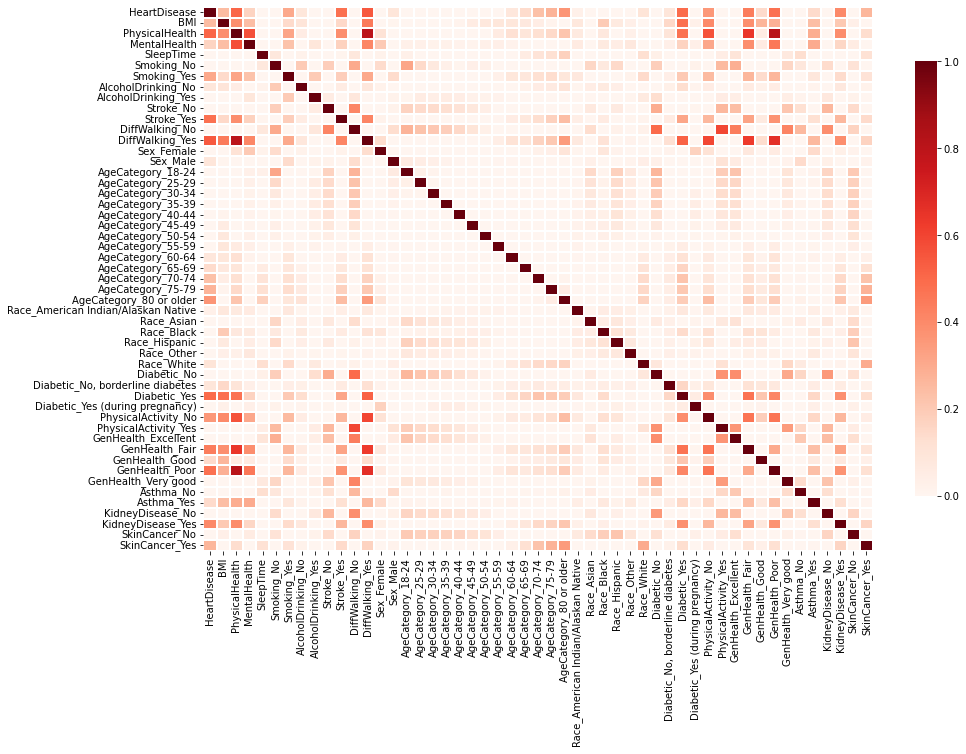

In [137]:
orig = pd.get_dummies(hearts)
orig_corr = orig.corr()
plt.figure(figsize=(15,10))
_ = sns.heatmap(orig_corr.corr(), cmap = 'Reds', vmin = 0.0, vmax = 1, linewidth=0.3, cbar_kws={"shrink": .8})



In [145]:
orig.to_csv('C:\\Users\\hanna\\OneDrive\\Desktop\\All Folders\\Data Science\\SpringBoard\\Guided Capstone 2\\dummies_data.csv', index=False)

Again we see the highest correlated variables are Physical Health with GenHealth_poor & Difficulty Walking.


Conclusion

- Categorical features
 - Heart Disease
 - Sex
 - Age Category
 - Race
 - Diabetic
 - General Health
 - Smoking
 - Alcohol Drinking
 - Stroke
 - Difficulty Walking
 - Asthma
 - Kidney Disease
 - Skin Cancer
 - Physical Activity
- Numerical features
 - BMI
 - Sleeptime
 - Physical Health
 - Mental Health

- Only 1.5% of people are American Indian/Alaskan Native, yet they have the highest percent of a heart disease.

- We also saw that the likelihood of having a heart problem may rise if you suffer from
 - Diabetes.
 - Smoking.
 - Kidney Disease.
 - Skin Cancer.
 - Your General Health is poor.
 - Stroke.
 - Difficulty Walking. 

- We also left data that were above a certain threshold so we can have two different models, one with outliers, and one without, same goes for duplicated rows. 

- Some of the imbalanced columns are 
 - Heart Disease
 - Stroke
 - PhysicalHealth
 - MentalHealth
 - DiffWalking
 - Race
 - Diabetic
 - KidneyDisease
 - SkinCancer